In [4]:
import cv2
import numpy
import matplotlib.pyplot as plt

In [5]:
from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error

In [6]:
cv2.setUseOptimized(True)

# Parameters initialization

First_Match_threshold = 2500 # default 2500             
Step1_max_matched_cnt = 16           
Step1_Blk_Size = 8                    
Step1_Blk_Step = 3  #default 3                    # Rather than sliding by one pixel to every next reference block, use a step of Nstep pixels in both horizontal and vertical directions.
Step1_Search_Step = 3    # default 3               
Step1_Search_Window = 39   # 39 default             # Search for candidate matching blocks in a local neighborhood of restricted size NS*NS centered

Second_Match_threshold = 40 #default 400           
Step2_max_matched_cnt = 32 # default 32
Step2_Blk_Size = 8
Step2_Blk_Step = 3 #default 3
Step2_Search_Step = 3 # default 3
Step2_Search_Window = 39 # default 39

Beta_Kaiser = 2.0 #default 2.0


def init(img, _blk_size, _Beta_Kaiser):
    m_shape = img.shape
    #m_img = numpy.matrix(numpy.zeros(m_shape, dtype=float))
    #m_wight = numpy.matrix(numpy.zeros(m_shape, dtype=float))
    m_img = numpy.zeros(m_shape, dtype=float)
    m_wight = numpy.zeros(m_shape, dtype=float)
    K = numpy.matrix(numpy.kaiser(_blk_size, _Beta_Kaiser))
    m_Kaiser = numpy.array(K.T * K)          
    return m_img, m_wight, m_Kaiser


def Locate_blk(i, j, blk_step, block_Size, width, height):
    if i*blk_step+block_Size < width:
        point_x = i*blk_step
    else:
        point_x = width - block_Size

    if j*blk_step+block_Size < height:
        point_y = j*blk_step
    else:
        point_y = height - block_Size

    m_blockPoint = numpy.array((point_x, point_y), dtype=int)  

    return m_blockPoint


def Define_SearchWindow(_noisyImg, _BlockPoint, _WindowSize, Blk_Size):
    point_x = _BlockPoint[0]  
    point_y = _BlockPoint[1]  

    #print("_noisyImg.shape = "+str(_noisyImg.shape))

    # 获得SearchWindow四个顶点的坐标
    LX = point_x+Blk_Size/2-_WindowSize/2    
    LY = point_y+Blk_Size/2-_WindowSize/2   
    RX = LX+_WindowSize                     
    RY = LY+_WindowSize                


    if LX < 0:   LX = 0
    elif RX > _noisyImg.shape[0]:   LX = _noisyImg.shape[0]-_WindowSize
    if LY < 0:   LY = 0
    elif RY > _noisyImg.shape[1]:   LY = _noisyImg.shape[1]-_WindowSize

    return numpy.array((LX, LY), dtype=int)


def Step1_fast_match_color(_noisyImg, _BlockPoint):
    (present_x, present_y) = _BlockPoint  
    Blk_Size = Step1_Blk_Size
    Search_Step = Step1_Search_Step
    Threshold = First_Match_threshold
    max_matched = Step1_max_matched_cnt
    Window_size = Step1_Search_Window
    chnl = _noisyImg.shape[2] # chnl = 3 for color image

    blk_positions = numpy.zeros((max_matched, 2), dtype=int) 
    Final_similar_blocks = numpy.zeros((max_matched, Blk_Size, Blk_Size, chnl), dtype=float)
    dct_img = numpy.zeros((Blk_Size, Blk_Size, chnl), dtype=float)
    dct_Tem_img = numpy.zeros((Blk_Size, Blk_Size, chnl), dtype=float)

    for ch in range(chnl):
        img = _noisyImg[present_x: present_x+Blk_Size, present_y: present_y+Blk_Size, ch]
        dct_img[:,:,ch] = cv2.dct(img.astype(numpy.float64))  
        Final_similar_blocks[0, :, :, ch] = dct_img[:,:,ch]

    blk_positions[0, :] = _BlockPoint

    Window_location = Define_SearchWindow(_noisyImg, _BlockPoint, Window_size, Blk_Size)
    blk_num = (Window_size-Blk_Size)/Search_Step  
    blk_num = int(blk_num)
    (present_x, present_y) = Window_location

    similar_blocks = numpy.zeros((blk_num**2, Blk_Size, Blk_Size, chnl), dtype=float)
    m_Blkpositions = numpy.zeros((blk_num**2, 2), dtype=int)
    Distances = numpy.zeros(blk_num**2, dtype=float)  


    matched_cnt = 0
    for i in range(blk_num):
        for j in range(blk_num):
            for ch in range(chnl):
                tem_img = _noisyImg[present_x: present_x+Blk_Size, present_y: present_y+Blk_Size, ch]
                #print("present_x = "+str(present_x)+"; present_y = "+str(present_y)+"; Blk_Size = "+str(Blk_Size))
                #print("tem_img.shape = "+str(tem_img.shape))
                dct_Tem_img[:,:,ch] = cv2.dct(tem_img.astype(numpy.float64))
                #print("dct_img.shape = "+str(dct_img.shape)+"; dct_Tem_img.shape = "+str(dct_Tem_img.shape))
            m_Distance = numpy.linalg.norm((dct_img[:,:,0]-dct_Tem_img[:,:,0]))**2 / (Blk_Size**2) # only on luminance
            #print("step 1 m_Distance : "+str(m_Distance)+ "; Threshold is "+str(Threshold)+"; matched_cnt is "+str(matched_cnt))
            #print("dct_img-dct_Tem_img = "+str(dct_img-dct_Tem_img))
            #print("dct_img = "+str(dct_img))
            #print("dct_Tem_img = "+str(dct_Tem_img))

            if m_Distance < Threshold and m_Distance > 0:  
                for ch in range(chnl):
                    similar_blocks[matched_cnt, :, :, ch] = dct_Tem_img[:,:,ch]
                m_Blkpositions[matched_cnt, :] = (present_x, present_y)
                Distances[matched_cnt] = m_Distance
                matched_cnt += 1
            present_y += Search_Step
        present_x += Search_Step
        present_y = Window_location[1]
    Distances = Distances[:matched_cnt]
    Sort = Distances.argsort()

    #print("Inside Step1_fast_match(), numpy.sum(numpy.abs(similar_blocks))) = "+str(numpy.sum(numpy.abs(similar_blocks))))

    if matched_cnt < max_matched:
        Count = matched_cnt + 1
    else:
        Count = max_matched

    if Count > 0:
        for i in range(1, Count):
            for ch in range(chnl):
                Final_similar_blocks[i, :, :, ch] = similar_blocks[Sort[i-1], :, :, ch]
            blk_positions[i, :] = m_Blkpositions[Sort[i-1], :]

    return Final_similar_blocks, blk_positions, Count


def Step1_3DFiltering_color(_similar_blocks, Threshold_Hard3D):
    chnl = _similar_blocks.shape[3] # chnl = 3 for color image
    statis_nonzero = numpy.zeros(chnl, dtype=int) 
    m_Shape = _similar_blocks.shape


    for i in range(m_Shape[1]):
        for j in range(m_Shape[2]):
            for ch in range(chnl):
                tem_Vct_Trans = cv2.dct(_similar_blocks[:, i, j, ch])
                tem_Vct_Trans[numpy.abs(tem_Vct_Trans[:]) < Threshold_Hard3D] = 0.
                statis_nonzero[ch] += tem_Vct_Trans.nonzero()[0].size
                _similar_blocks[:, i, j, ch] = cv2.idct(tem_Vct_Trans)[0]
    return _similar_blocks, statis_nonzero


def Aggregation_hardthreshold_color(_similar_blocks, blk_positions, m_basic_img, m_wight_img, _nonzero_num, Count, Kaiser):
    _shape = _similar_blocks.shape
    chnl = _similar_blocks.shape[3]
    for ch in range(chnl):
        if _nonzero_num[ch] < 1:
            _nonzero_num[ch] = 1
        block_wight = (1./_nonzero_num[ch]) * Kaiser
        for i in range(Count):
            point = blk_positions[i, :]
            tem_img = (1./_nonzero_num[ch])*cv2.idct(_similar_blocks[i, :, :, ch]) * Kaiser
            m_basic_img[point[0]:point[0]+_shape[1], point[1]:point[1]+_shape[2], ch] += tem_img
            m_wight_img[point[0]:point[0]+_shape[1], point[1]:point[1]+_shape[2], ch] += block_wight


def BM3D_1st_step_color(_noisyImg, Threshold_Hard3D):
    (width, height,chnl) = _noisyImg.shape 
    block_Size = Step1_Blk_Size         
    blk_step = Step1_Blk_Step         
    Width_num = (width - block_Size)/blk_step
    Height_num = (height - block_Size)/blk_step
    chnl = _noisyImg.shape[2]

    Basic_img, m_Wight, m_Kaiser = init(_noisyImg, Step1_Blk_Size, Beta_Kaiser)

    print("step 1: Width_num = " + str(Width_num) + ", Height_num = " + str(Height_num))

    for i in range(int(Width_num+2)):
        for j in range(int(Height_num+2)):
            # m_blockPoint
            m_blockPoint = Locate_blk(i, j, blk_step, block_Size, width, height)       
            Similar_Blks, Positions, Count = Step1_fast_match_color(_noisyImg, m_blockPoint)
            #print("step 1 Similar_Blks shape : "+str(Similar_Blks.shape)+"; Count = "+str(Count)+"; sum(abs(Similar_Blks)) = "+str(numpy.sum(numpy.abs(Similar_Blks))))
            Similar_Blks, statis_nonzero = Step1_3DFiltering_color(Similar_Blks, Threshold_Hard3D)
            #print("step 1 Similar_Blks shape : "+str(Similar_Blks.shape)+"; step 1 statis_nonzero = "+str(statis_nonzero))
            Aggregation_hardthreshold_color(Similar_Blks, Positions, Basic_img, m_Wight, statis_nonzero, Count, m_Kaiser)
    for ch in range(chnl):
        Basic_img[:, :, ch] /= m_Wight[:, :, ch]
    #basic = numpy.matrix(Basic_img, dtype=int)
    basic = numpy.array(Basic_img, dtype=numpy.int32)
    basic = numpy.clip(basic, 0, 255)
    basic = numpy.array(basic, dtype=numpy.uint8)

    return basic


def Step2_fast_match_color(_Basic_img, _noisyImg, _BlockPoint):
    (present_x, present_y) = _BlockPoint  
    Blk_Size = Step2_Blk_Size
    Threshold = Second_Match_threshold
    Search_Step = Step2_Search_Step
    max_matched = Step2_max_matched_cnt
    Window_size = Step2_Search_Window
    chnl = _noisyImg.shape[2] # chnl = 3 for color image

    blk_positions = numpy.zeros((max_matched, 2), dtype=int)  
    Final_similar_blocks = numpy.zeros((max_matched, Blk_Size, Blk_Size, chnl), dtype=float)
    Final_noisy_blocks = numpy.zeros((max_matched, Blk_Size, Blk_Size, chnl), dtype=float)
    dct_img = numpy.zeros((Blk_Size, Blk_Size, chnl), dtype=float)
    dct_n_img = numpy.zeros((Blk_Size, Blk_Size, chnl), dtype=float)
    dct_Tem_img = numpy.zeros((Blk_Size, Blk_Size, chnl), dtype=float)

    for ch in range(chnl):
        img = _Basic_img[present_x: present_x+Blk_Size, present_y: present_y+Blk_Size, ch]
        dct_img[:,:,ch] = cv2.dct(img.astype(numpy.float64))  
        Final_similar_blocks[0, :, :, ch] = dct_img[:,:,ch]

        n_img = _noisyImg[present_x: present_x+Blk_Size, present_y: present_y+Blk_Size, ch]
        dct_n_img[:,:,ch] = cv2.dct(n_img.astype(numpy.float64)) 
        Final_noisy_blocks[0, :, :,ch] = dct_n_img[:,:,ch]

    blk_positions[0, :] = _BlockPoint

    Window_location = Define_SearchWindow(_noisyImg, _BlockPoint, Window_size, Blk_Size)
    blk_num = (Window_size-Blk_Size)/Search_Step
    blk_num = int(blk_num)
    (present_x, present_y) = Window_location

    similar_blocks = numpy.zeros((blk_num**2, Blk_Size, Blk_Size,chnl), dtype=float)
    m_Blkpositions = numpy.zeros((blk_num**2, 2), dtype=int)
    Distances = numpy.zeros(blk_num**2, dtype=float)  

    matched_cnt = 0
    for i in range(blk_num):
        for j in range(blk_num):
            for ch in range(chnl):
                tem_img = _Basic_img[present_x: present_x+Blk_Size, present_y: present_y+Blk_Size, ch]
                dct_Tem_img[:,:,ch] = cv2.dct(tem_img.astype(numpy.float64))
            m_Distance = numpy.linalg.norm((dct_img-dct_Tem_img))**2 / (Blk_Size**2)
            #print("dct_img-dct_Tem_img = "+str(dct_img-dct_Tem_img))
            #print("dct_img = "+str(dct_img))
            #print("dct_Tem_img = "+str(dct_Tem_img))

            #print("step 2 m_Distance : "+str(m_Distance)+ "; Threshold is "+str(Threshold)+"; matched_cnt is "+str(matched_cnt))

            if m_Distance < Threshold and m_Distance > 0:
                for ch in range(chnl):
                    similar_blocks[matched_cnt, :, :,ch] = dct_Tem_img[:,:,ch]
                m_Blkpositions[matched_cnt, :] = (present_x, present_y)
                Distances[matched_cnt] = m_Distance
                matched_cnt += 1
            present_y += Search_Step
        present_x += Search_Step
        present_y = Window_location[1]
    Distances = Distances[:matched_cnt]
    Sort = Distances.argsort()

    if matched_cnt < max_matched:
        Count = matched_cnt + 1
    else:
        Count = max_matched

    if Count > 0:
        for i in range(1, Count):
            for ch in range(chnl):
                Final_similar_blocks[i, :, :,ch] = similar_blocks[Sort[i-1], :, :,ch]
            blk_positions[i, :] = m_Blkpositions[Sort[i-1], :]

            (present_x, present_y) = m_Blkpositions[Sort[i-1], :]
            for ch in range(chnl):
                n_img = _noisyImg[present_x: present_x+Blk_Size, present_y: present_y+Blk_Size, ch]
                Final_noisy_blocks[i, :, :, ch] = cv2.dct(n_img.astype(numpy.float64))

    return Final_similar_blocks, Final_noisy_blocks, blk_positions, Count


def Step2_3DFiltering_color(_Similar_Bscs, _Similar_Imgs, Count, sigma_color):
    chnl = _Similar_Bscs.shape[3] # chnl = 3 for color image
    m_Shape = _Similar_Bscs.shape
    Wiener_wight = numpy.zeros((m_Shape[1], m_Shape[2], m_Shape[3]), dtype=float)

    for i in range(m_Shape[1]):
        for j in range(m_Shape[2]):
            for ch in range(chnl):
                tem_vector = _Similar_Bscs[:, i, j, ch]
                tem_Vct_Trans = numpy.matrix(cv2.dct(tem_vector))
                Norm_2 = numpy.float64(tem_Vct_Trans.T * tem_Vct_Trans)
                m_weight = Norm_2/Count/(Norm_2/Count + sigma_color[ch]**2)
                #print("m_weight = "+str(m_weight))
                if m_weight != 0:
                    Wiener_wight[i, j, ch] = 1./(m_weight**2 * sigma_color[ch]**2)
                else:
                    Wiener_wight[i, j] = 10000
                tem_vector = _Similar_Imgs[:, i, j, ch]
                tem_Vct_Trans = m_weight * cv2.dct(tem_vector)
                _Similar_Bscs[:, i, j, ch] = cv2.idct(tem_Vct_Trans)[0]

    return _Similar_Bscs, Wiener_wight


def Aggregation_Wiener_color(_Similar_Blks, _Wiener_wight, blk_positions, m_basic_img, m_wight_img, Count, Kaiser):
    _shape = _Similar_Blks.shape
    #block_wight = _Wiener_wight # * Kaiser
    chnl = _Similar_Blks.shape[3]

    for ch in range(chnl):
        for i in range(Count):
            point = blk_positions[i, :]
            tem_img = _Wiener_wight[:,:,ch] * cv2.idct(_Similar_Blks[i, :, :, ch]) # * Kaiser
            #tem_img = _Wiener_wight * _Similar_Blks[i, :, :] # * Kaiser
            m_basic_img[point[0]:point[0]+_shape[1], point[1]:point[1]+_shape[2],ch] += tem_img
            m_wight_img[point[0]:point[0]+_shape[1], point[1]:point[1]+_shape[2],ch] += _Wiener_wight[:,:,ch]


def BM3D_2nd_step_color(_basicImg, _noisyImg, sigma_color):
    (width, height,chnl) = _noisyImg.shape
    block_Size = Step2_Blk_Size
    blk_step = Step2_Blk_Step
    Width_num = (width - block_Size)/blk_step
    Height_num = (height - block_Size)/blk_step

    # 初始化几个数组
    m_img, m_Wight, m_Kaiser = init(_noisyImg, block_Size, Beta_Kaiser)

    print("step 2: Width_num = " + str(Width_num) + ", Height_num = " + str(Height_num))

    for i in range(int(Width_num+2)):
        for j in range(int(Height_num+2)):
            m_blockPoint = Locate_blk(i, j, blk_step, block_Size, width, height)
            Similar_Blks, Similar_Imgs, Positions, Count = Step2_fast_match_color(_basicImg, _noisyImg, m_blockPoint)
            #print("step 2 Similar_Blks shape : "+str(Similar_Blks.shape)+"; Count = "+str(Count)+"; sum(abs(Similar_Blks)) = "+str(numpy.sum(numpy.abs(Similar_Blks))))
            Similar_Blks, Wiener_wight = Step2_3DFiltering_color(Similar_Blks, Similar_Imgs, Count, sigma_color)
            #print(Similar_Blks.shape)
            Aggregation_Wiener_color(Similar_Blks, Wiener_wight, Positions, m_img, m_Wight, Count, m_Kaiser)
    for ch in range(chnl):
        m_img[:, :, ch] /= m_Wight[:, :, ch]

    Final = numpy.array(m_img, dtype=numpy.int32)
    Final = numpy.clip(Final, 0, 255)
    Final = numpy.array(Final, dtype=numpy.uint8)

    return Final


def PSNR2(img1, img2):
    D = numpy.array(img2, dtype=numpy.int64) - numpy.array(img1, dtype=numpy.int64)
    D = D**2
    RMSE = D.sum()/img1.size
    psnr = 10*numpy.log10(float(255.**2)/RMSE)
    return psnr

In [7]:
def bm3d(img_name, sigma=25):
    cv2.setUseOptimized(True)   
    #sigma = 20 #50 # default 25
    Threshold_Hard3D = 2.7*sigma#46 # default 2.7*sigma(default 25)           # Threshold for Hard Thresholding
    sigma_color = [0, 0, 0];
    sigma_color[0] = numpy.sqrt(0.299*0.299 + 0.587*0.587 + 0.114*0.144)*sigma
    sigma_color[1] = numpy.sqrt(0.169*0.169 + 0.331*0.331 + 0.5*0.5)*sigma
    sigma_color[2] = numpy.sqrt(0.5*0.5 + 0.419*0.419 + 0.081*0.081)*sigma
    print("sigma = "+str(sigma))

    #img_name_gold = "balloons_noisy.png"
    #img_name_gold = "image_Lena512rgb.png"
    img_name_gold = img_name
    img_gold = cv2.imread(img_name_gold, cv2.IMREAD_COLOR)
    noise = numpy.random.normal(scale=sigma,
                                size=img_gold.shape).astype(numpy.int32)

    img = img_gold + noise
    img = numpy.clip(img, 0, 255)
    img = img.astype(numpy.uint8)


    imgYCB = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    imgYCB_gold = cv2.cvtColor(img_gold, cv2.COLOR_BGR2YCrCb)

    #cv2.imwrite("Noisy_sigma"+str(sigma)+"_color.png", img)

    psnr = PSNR2(img, img_gold)
    print ("The PSNR between noisy image and ref image is %f" % psnr)

    # 记录程序运行时间
    e1 = cv2.getTickCount()  # cv2.getTickCount 函数返回从参考点到这个函数被执行的时钟数
    Basic_img = BM3D_1st_step_color(imgYCB, Threshold_Hard3D)

    e2 = cv2.getTickCount()
    time = (e2 - e1) / cv2.getTickFrequency()   # 计算函数执行时间
    print()
    print ("The Processing time of the First step is %f s" % time)

    cv2.imwrite("Basic_sigma"+str(sigma)+"_color.png", cv2.cvtColor(Basic_img, cv2.COLOR_YCrCb2BGR))
    psnr = PSNR2(img_gold, cv2.cvtColor(Basic_img, cv2.COLOR_YCrCb2BGR))
    print ("The PSNR compared with gold image for the First step is %f" % psnr)


    Final_img = BM3D_2nd_step_color(Basic_img, imgYCB, sigma_color)
    cv2.imwrite("Final_sigma"+str(sigma)+"_color.png", cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR))


    e3 = cv2.getTickCount()
    time = (e3 - e2) / cv2.getTickFrequency()
    print()
    print ("The Processing time of the Second step is %f s" % time)
    psnr = PSNR2(img_gold, cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR))
    print ("The PSNR compared with gold image for the Second step is %f" % psnr)

    return img_gold, img, Basic_img, Final_img

In [8]:
def make_plot(img_gold, noise_img, Basic_img, Final_img, sigma):

    plt.figure(figsize=(23, 10))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img_gold, cv2.COLOR_BGR2RGB))
    plt.title('Original image')

    psnr = PSNR2(img_gold, noise_img)
    s = ssim(img_gold, noise_img, data_range=noise_img.max()-img_gold.min(), multichannel=True)

    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(noise_img, cv2.COLOR_BGR2RGB))
    plt.title('Noisy image, sigma = ' + str(sigma)+', psnr = '+str(psnr.round(2))+', ssim = '+str(s.round(3)))

    psnr = PSNR2(img_gold, cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR))
    s = ssim(img_gold, cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR),
             data_range=cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR).max()-img_gold.min(), multichannel=True)

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2RGB))
    plt.title('Final image, psnr = '+str(psnr.round(2))+', ssim = '+str(s.round(3)))

sigma = 10.0
The PSNR between noisy image and ref image is 28.497628
step 1: Width_num = 168.0, Height_num = 168.0

The Processing time of the First step is 183.816835 s
The PSNR compared with gold image for the First step is 30.196721
step 2: Width_num = 168.0, Height_num = 168.0

The Processing time of the Second step is 266.581122 s
The PSNR compared with gold image for the Second step is 31.712073
sigma = 20.0
The PSNR between noisy image and ref image is 22.422950
step 1: Width_num = 168.0, Height_num = 168.0

The Processing time of the First step is 178.400293 s
The PSNR compared with gold image for the First step is 29.404953
step 2: Width_num = 168.0, Height_num = 168.0

The Processing time of the Second step is 270.057193 s
The PSNR compared with gold image for the Second step is 30.163705
sigma = 30.0
The PSNR between noisy image and ref image is 18.980822
step 1: Width_num = 168.0, Height_num = 168.0

The Processing time of the First step is 173.758281 s
The PSNR compared wi

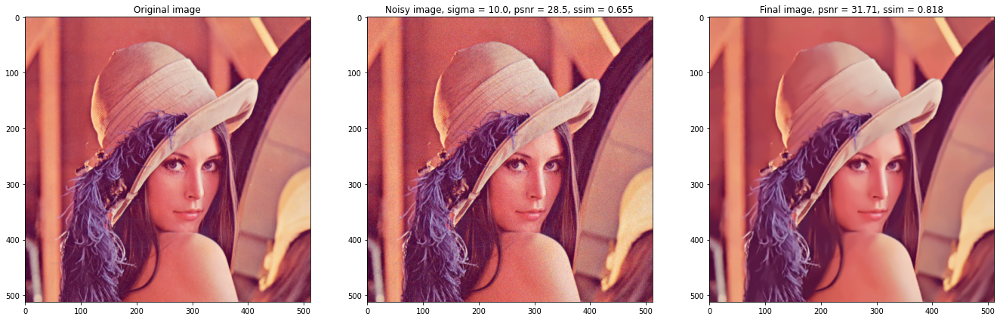

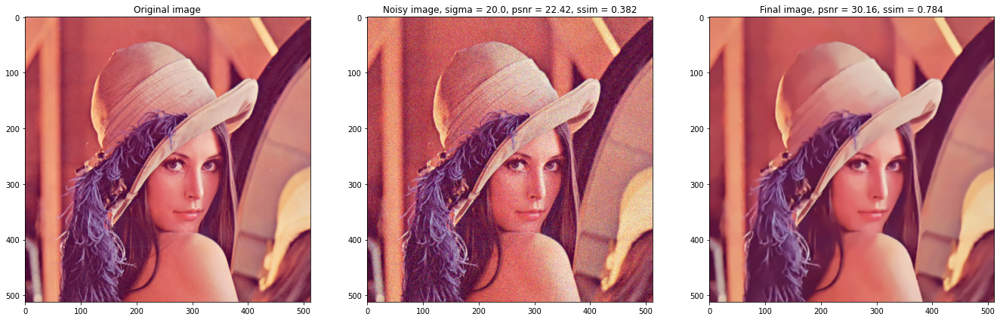

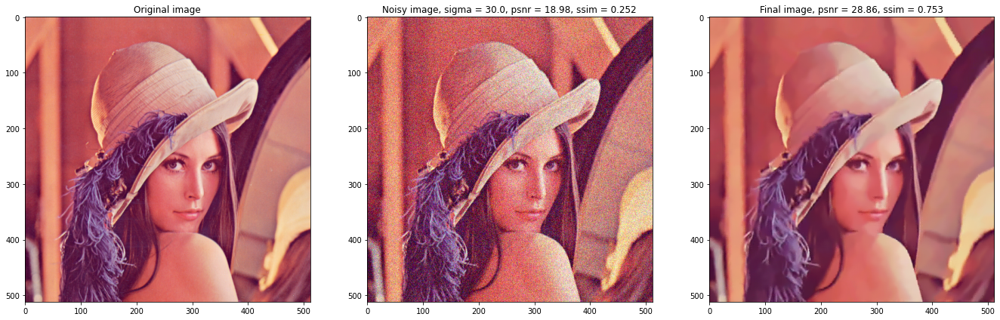

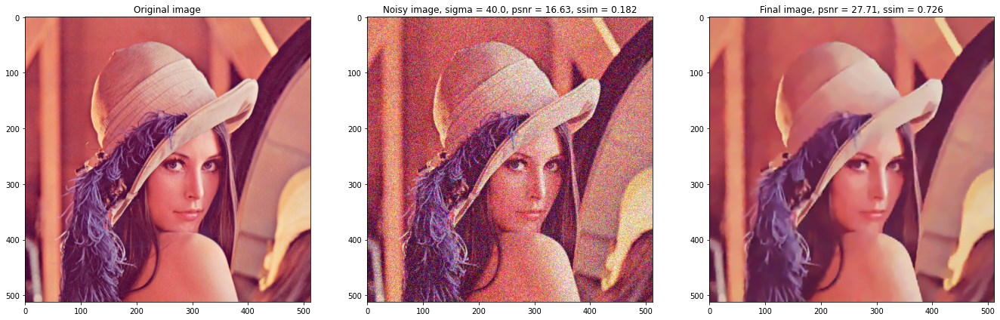

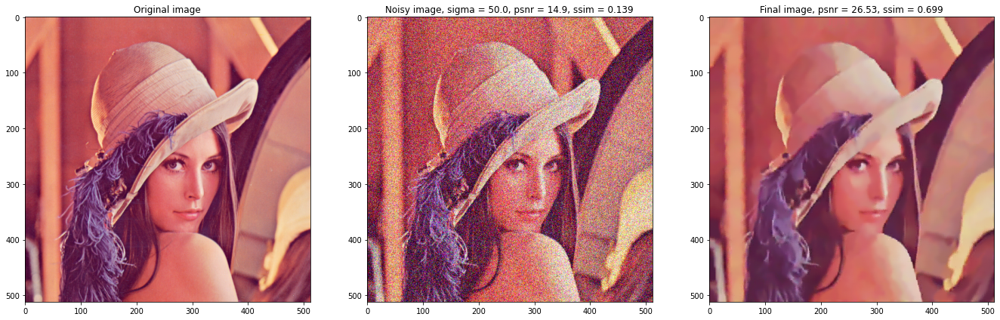

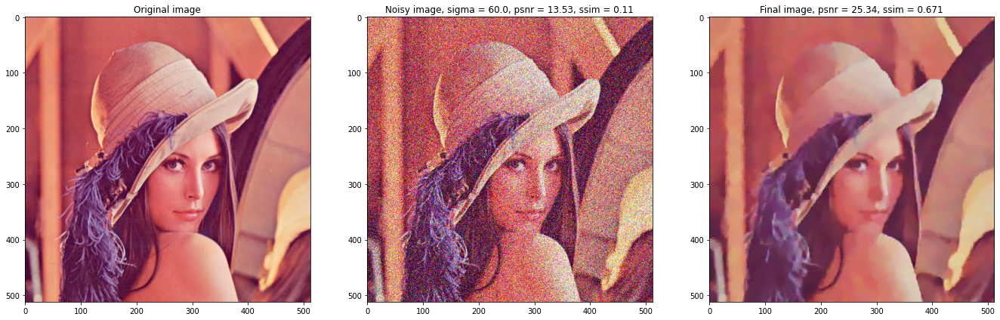

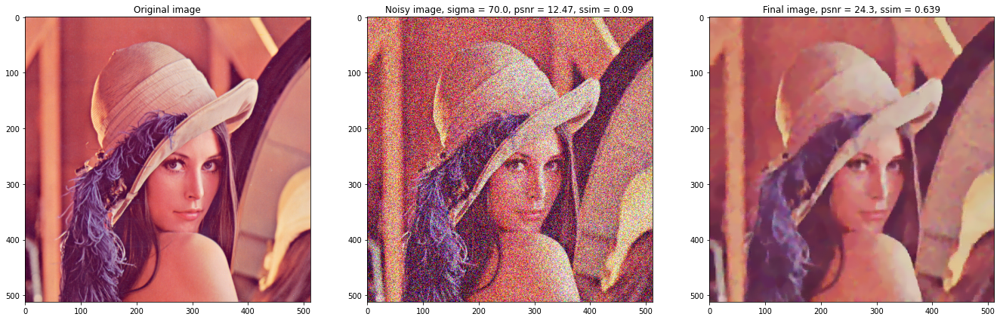

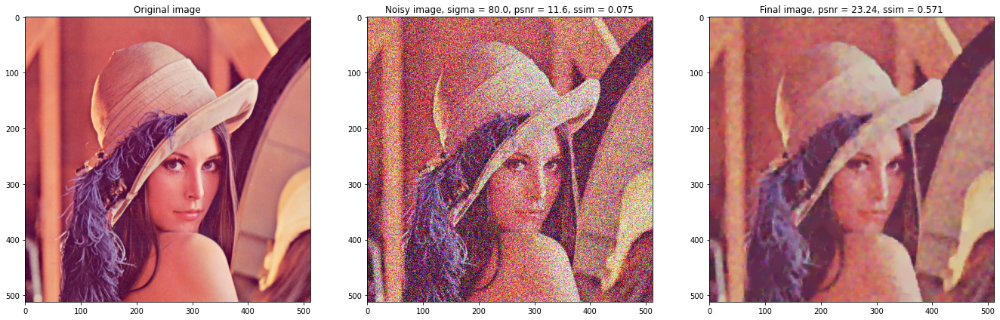

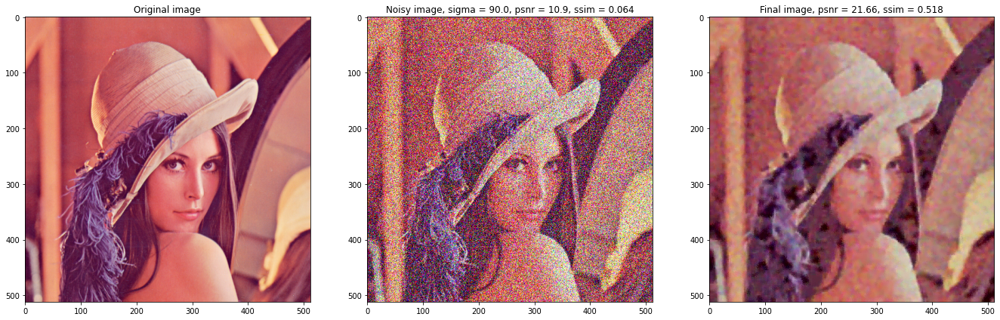

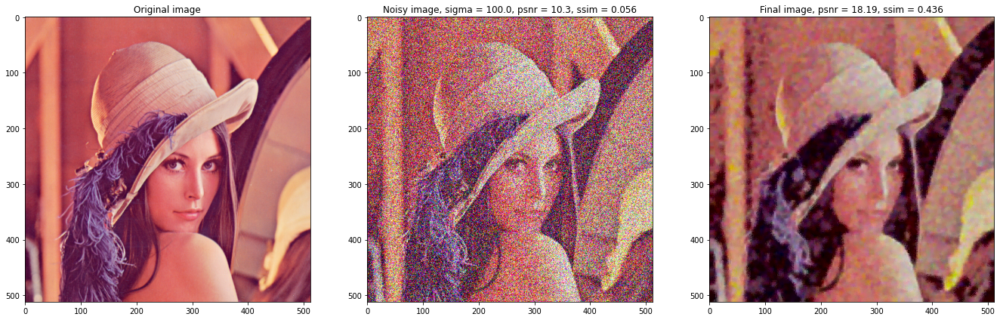

In [9]:
sigmas = numpy.linspace(10, 100, 10)
names = ["image_Lena512rgb.png", "4.1.05.tiff", "4.2.01.tiff", "4.2.03.tiff", "4.2.07.tiff"]

psnr_list = []
ssim_list = []

for sigma in sigmas:
    img_gold, img, Basic_img, Final_img = bm3d(names[0], sigma=sigma)
    make_plot(img_gold, img, Basic_img, Final_img, sigma)
    psnr_list.append(PSNR2(img_gold, cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR)))
    ssim_list.append(ssim(img_gold, cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR),
                           data_range=cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR).max()-img_gold.min(), multichannel=True))

In [ ]:
plt.plot(sigmas, psnr_list)
plt.plot(sigmas, ssim_list)
lists_psnr = []
ssim_list_comparison = []
lists_psnr.append(psnr_list)
ssim_list_comparison.append(ssim_list)

In [ ]:
psnr_list = []
ssim_list = []

for sigma in sigmas:
    img_gold, img, Basic_img, Final_img = bm3d(names[1], sigma=sigma)
    make_plot(img_gold, img, Basic_img, Final_img, sigma)
    psnr_list.append(PSNR2(img_gold, cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR)))
    ssim_list.append(ssim(img_gold, cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR),
                           data_range=cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR).max()-img_gold.min(), multichannel=True))

In [ ]:
plt.plot(sigmas, psnr_list)
plt.plot(sigmas, ssim_list)
lists_psnr.append(psnr_list)
ssim_list_comparison.append(ssim_list)
psnr_list = []
ssim_list = []

In [ ]:
for sigma in sigmas:
    img_gold, img, Basic_img, Final_img = bm3d(names[2], sigma=sigma)
    make_plot(img_gold, img, Basic_img, Final_img, sigma)
    psnr_list.append(PSNR2(img_gold, cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR)))
    ssim_list.append(ssim(img_gold, cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR),
                           data_range=cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR).max()-img_gold.min(), multichannel=True))

In [ ]:
plt.plot(sigmas, psnr_list)
plt.plot(sigmas, ssim_list)
lists_psnr.append(psnr_list)
ssim_list_comparison.append(ssim_list)
psnr_list = []
ssim_list = []

In [ ]:
for sigma in sigmas:
    img_gold, img, Basic_img, Final_img = bm3d(names[3], sigma=sigma)
    make_plot(img_gold, img, Basic_img, Final_img, sigma)
    psnr_list.append(PSNR2(img_gold, cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR)))
    ssim_list.append(ssim(img_gold, cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR),
                           data_range=cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR).max()-img_gold.min(), multichannel=True))

In [ ]:
plt.plot(sigmas, psnr_list)
plt.plot(sigmas, ssim_list)
lists_psnr.append(psnr_list)
ssim_list_comparison.append(ssim_list)
psnr_list = []
ssim_list = []

In [ ]:
psnr_list = []
ssim_list = []

for sigma in sigmas:
    img_gold, img, Basic_img, Final_img = bm3d(names[4], sigma=sigma)
    make_plot(img_gold, img, Basic_img, Final_img, sigma)
    psnr_list.append(PSNR2(img_gold, cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR)))
    ssim_list.append(ssim(img_gold, cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR),
                           data_range=cv2.cvtColor(Final_img, cv2.COLOR_YCrCb2BGR).max()-img_gold.min(), multichannel=True))

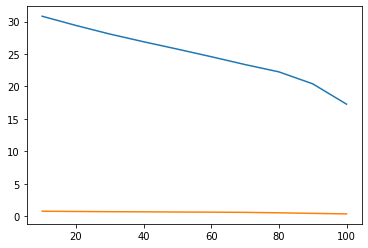

In [18]:
plt.plot(sigmas, psnr_list)
plt.plot(sigmas, ssim_list)
lists_psnr.append(psnr_list)
ssim_list_comparison.append(ssim_list)
psnr_list = []
ssim_list = []

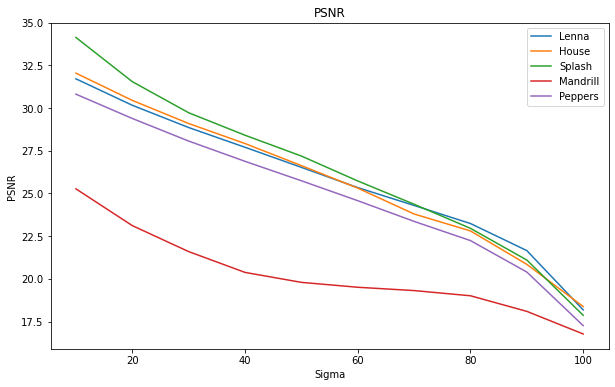

In [23]:
plt.figure(figsize=(10, 6))
for i in range(5):
    plt.plot(sigmas, lists_psnr[i])
plt.legend(['Lenna','House', 'Splash', 'Mandrill', 'Peppers'], loc='upper right')
plt.xlabel('Sigma')
plt.ylabel('PSNR')
plt.title('PSNR')
plt.show()

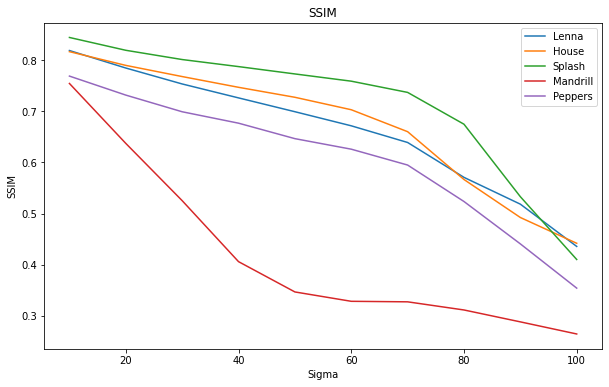

In [24]:
plt.figure(figsize=(10, 6))
for i in range(5):
    plt.plot(sigmas, ssim_list_comparison[i])
plt.legend(['Lenna','House', 'Splash', 'Mandrill', 'Peppers'], loc='upper right')
plt.xlabel('Sigma')
plt.ylabel('SSIM')
plt.title('SSIM')
plt.show()